In [36]:
import cv2
from PIL import Image
from matplotlib import pyplot as plt

In [3]:
# image=Image.open('data/page_01.jpg')
# image.load()

In [37]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

# Binarization

In [22]:
def grayscale(image):
    return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [23]:
def showImg(img_name):
    
    cv2.imshow('original', img_name)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

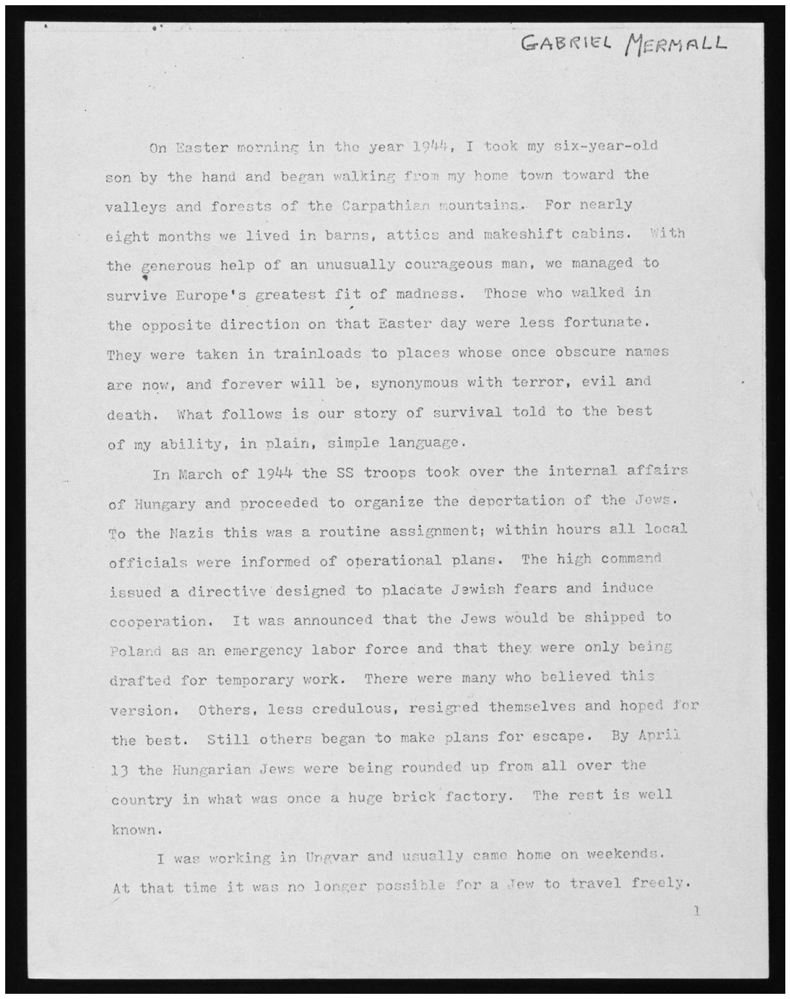

In [41]:
img_file=cv2.imread('data/page_01.jpg')


gray_image=grayscale(img_file)
cv2.imwrite('data/new_one-01.jpg',gray_image)

# showImg(img_file)
display('data/new_one-01.jpg')

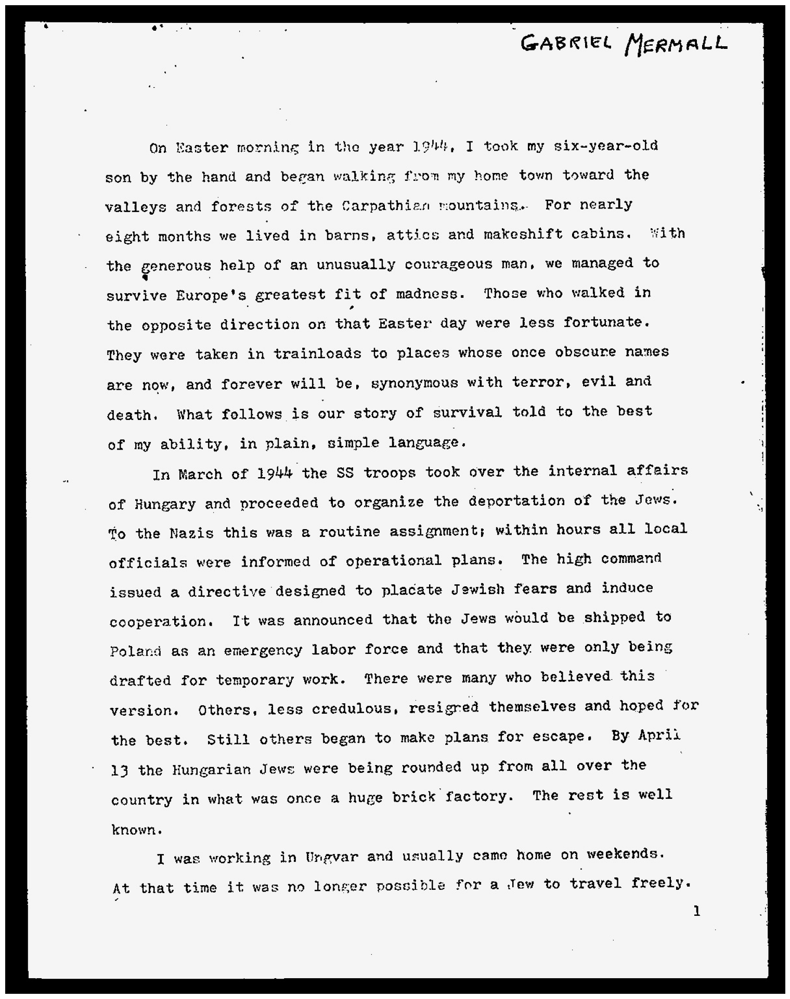

In [40]:
thresh,im_bw=cv2.threshold(gray_image,200,230,cv2.THRESH_BINARY)
cv2.imwrite('temp/bw_image.jpg',im_bw)

display('temp/bw_image.jpg')

 # Noise Remover

In [48]:
def noise_removal(image):
    import numpy as np
    kernal=np.ones((1,1),np.uint8)
    image=cv2.dilate(image, kernal, iterations=1)
    kernal=np.ones((1,1),np.uint8)
    image=cv2.erode(image, kernal, iterations=1)
    image=cv2.morphologyEx(image,cv2.MORPH_CLOSE, kernal)
    image=cv2.medianBlur(image,3)
    return(image)

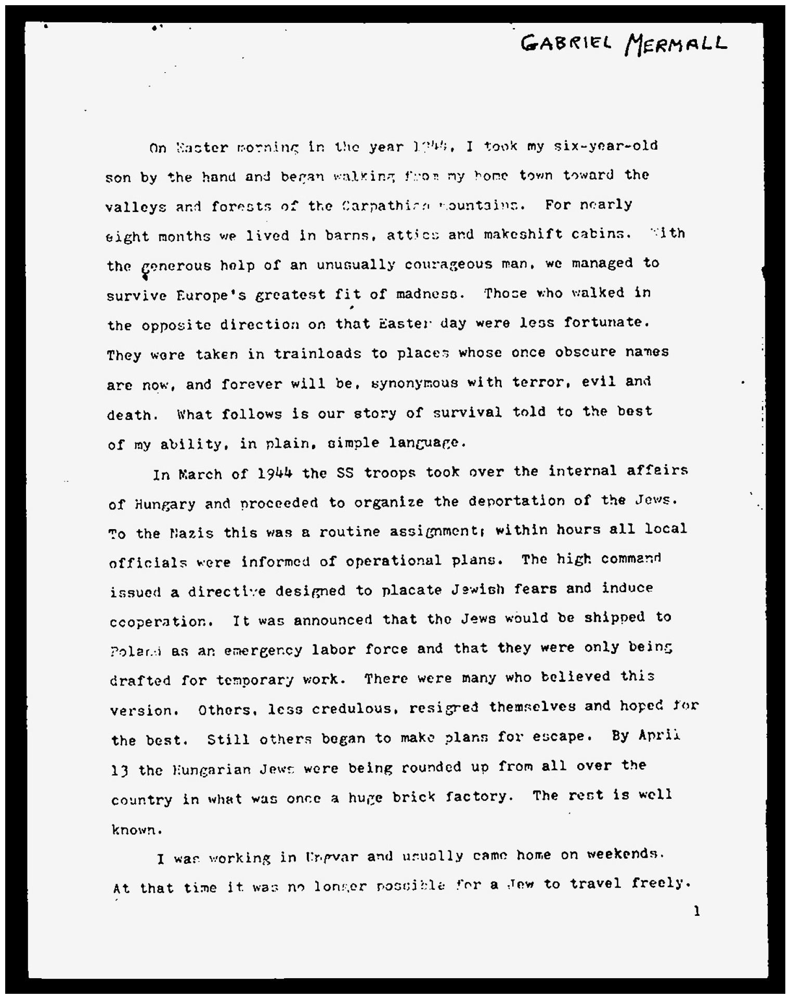

In [49]:
no_noise= noise_removal(im_bw)
cv2.imwrite('temp/no_noise.jpg', no_noise)

display('temp/no_noise.jpg')


 # Dilation nd Erosion

In [60]:
def thin_font(image):
    import numpy as np
#   image covert into B&W 
    image=cv2.bitwise_not(image) 
    kernal=np.ones((2,2),np.uint8)
#   thin the font( comes the pixels down)
    image=cv2.erode(image,kernal,iterations=1)
#   reconvert into Black font white background
    image=cv2.bitwise_not(image)
    return(image)

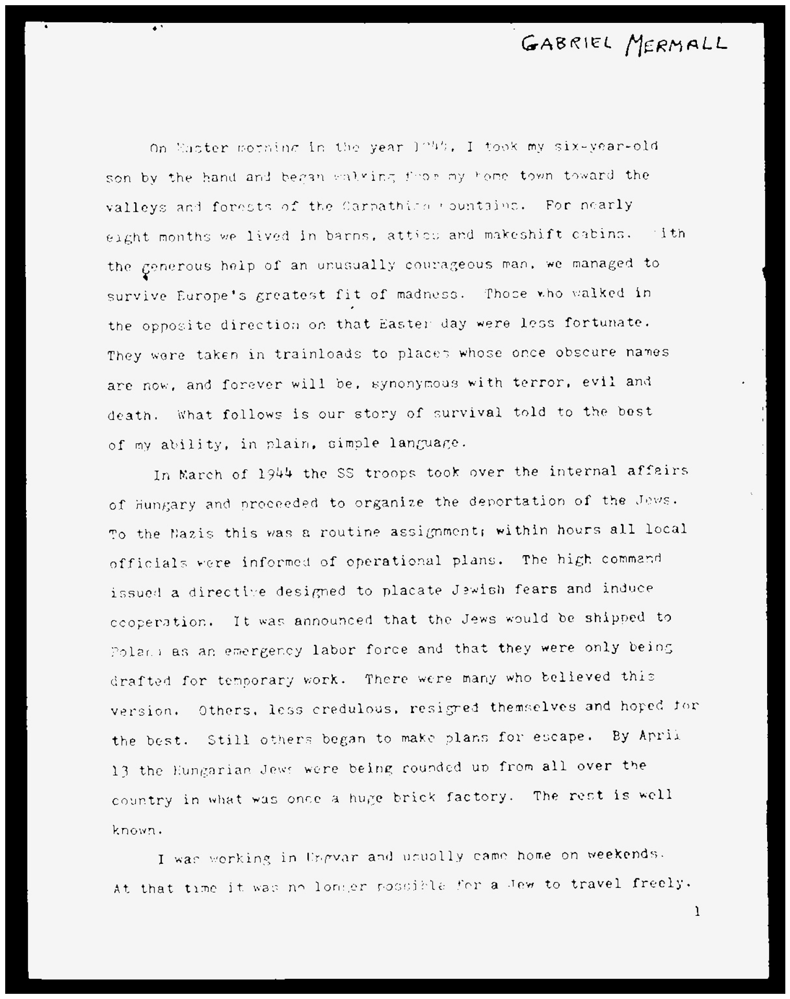

In [61]:
erode_image=thin_font(no_noise)
cv2.imwrite('temp/eroded_image.jpg', erode_image)

display('temp/eroded_image.jpg')

In [68]:
def thick_font(image):
    import numpy as np
#   image covert into B&W 
    image=cv2.bitwise_not(image) 
    kernal=np.ones((2,2),np.uint8)
#   thin the font( comes the pixels down)
    image=cv2.dilate(image,kernal,iterations=1)
#   reconvert into Black font white background
    image=cv2.bitwise_not(image)
    return(image)

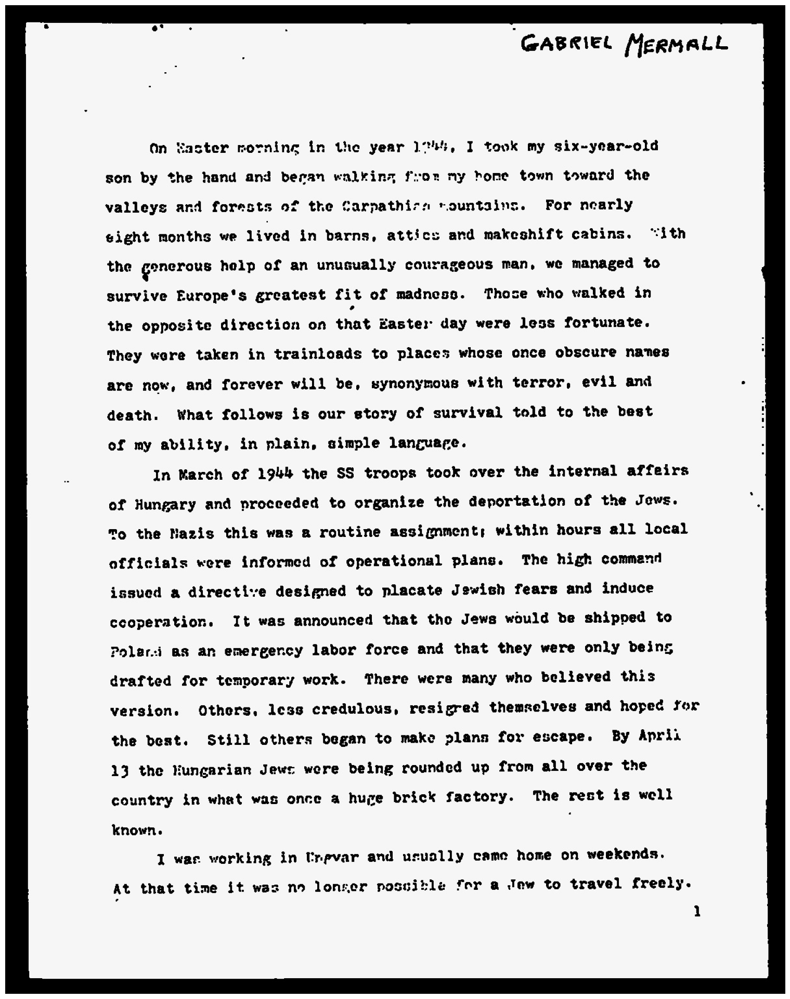

In [69]:
dilated_image= thick_font(no_noise)
cv2.imwrite('temp/dilated.jpg',dilated_image)

display('temp/dilated.jpg')

# Rotation / Deskewing 

In [79]:
new=cv2.imread('data/page_01_rotated.JPG')
# display('data/page_01_rotated.JPG')

In [96]:
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [93]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [94]:
fixed = deskew(new)
cv2.imwrite("temp/rotated_fixed.jpg", fixed)

28


True

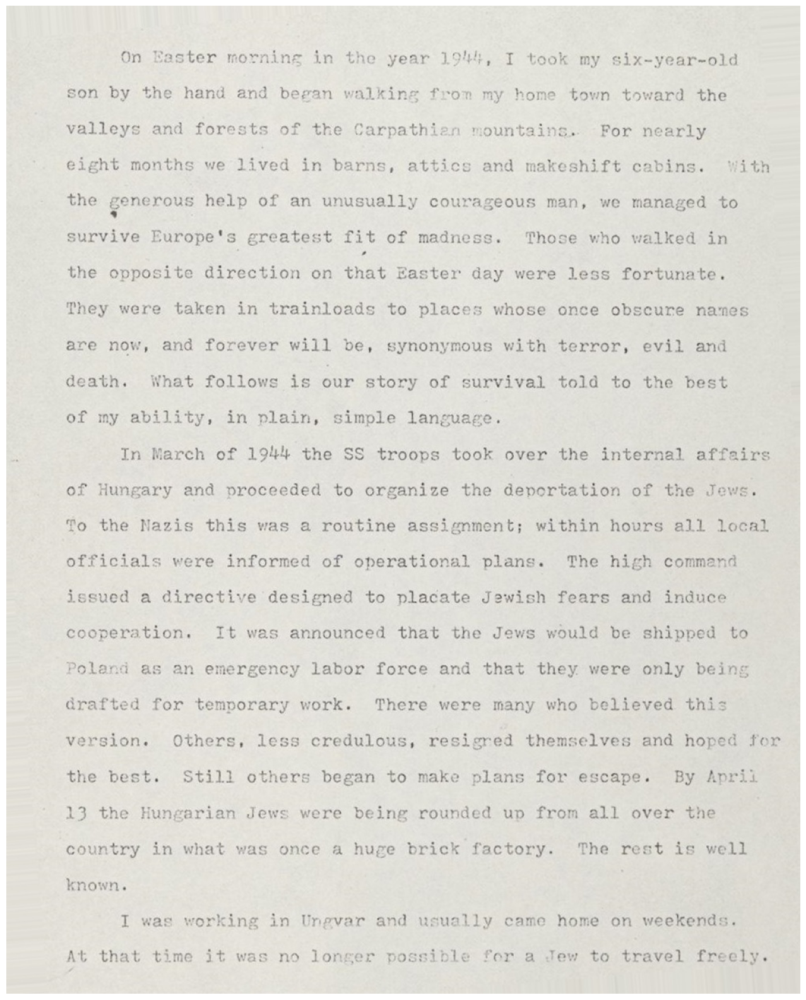

In [95]:
display('temp/rotated_fixed.jpg')

# Removing Borders

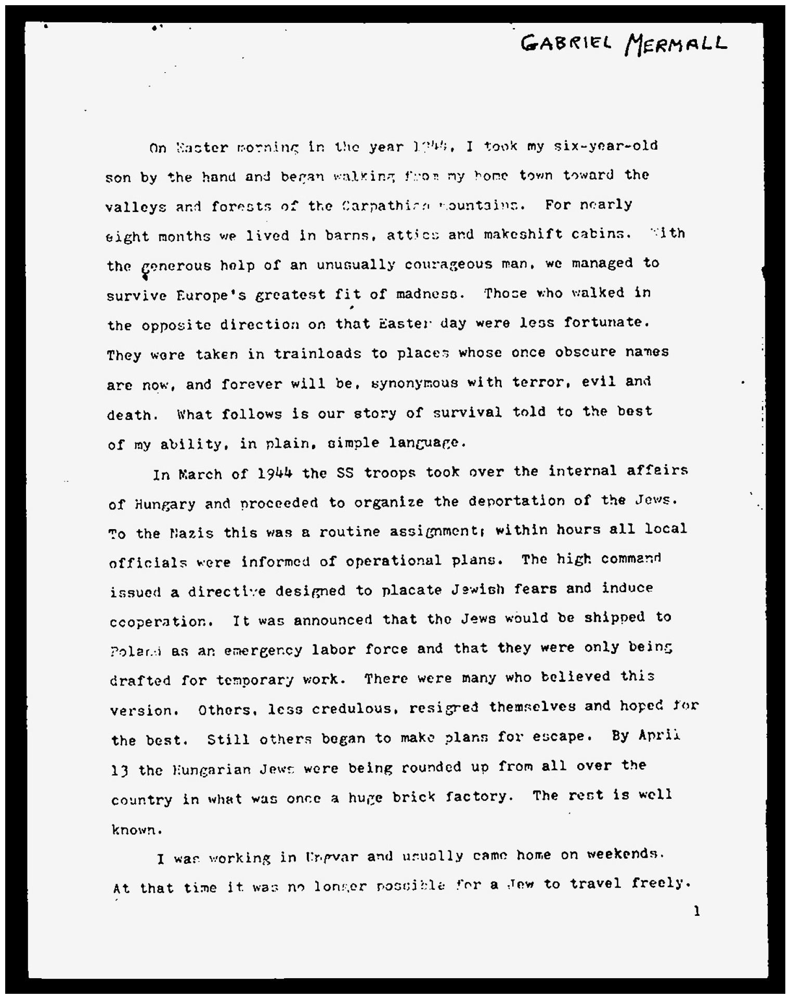

In [97]:
display('temp/no_noise.jpg')

In [104]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

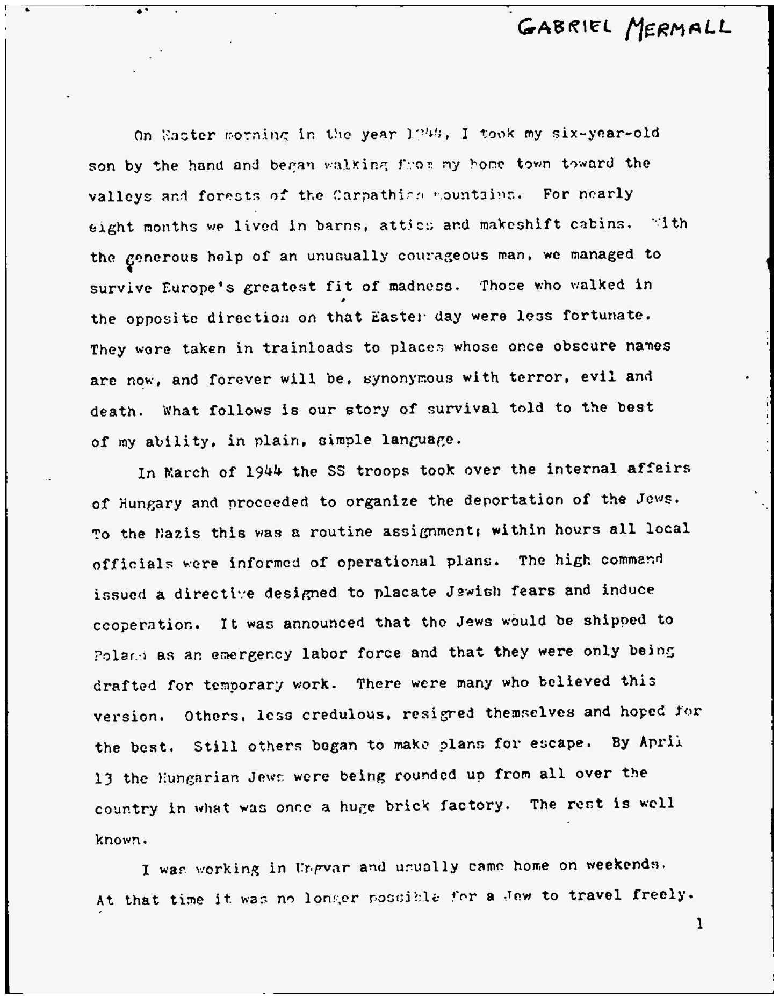

In [105]:
no_border=remove_borders(no_noise)
cv2.imwrite('temp/no_border.jpg',no_border)

display('temp/no_border.jpg')

# Missing Border

In [106]:
color = [255, 255, 255]
top, bottom, left, right = [150]*4

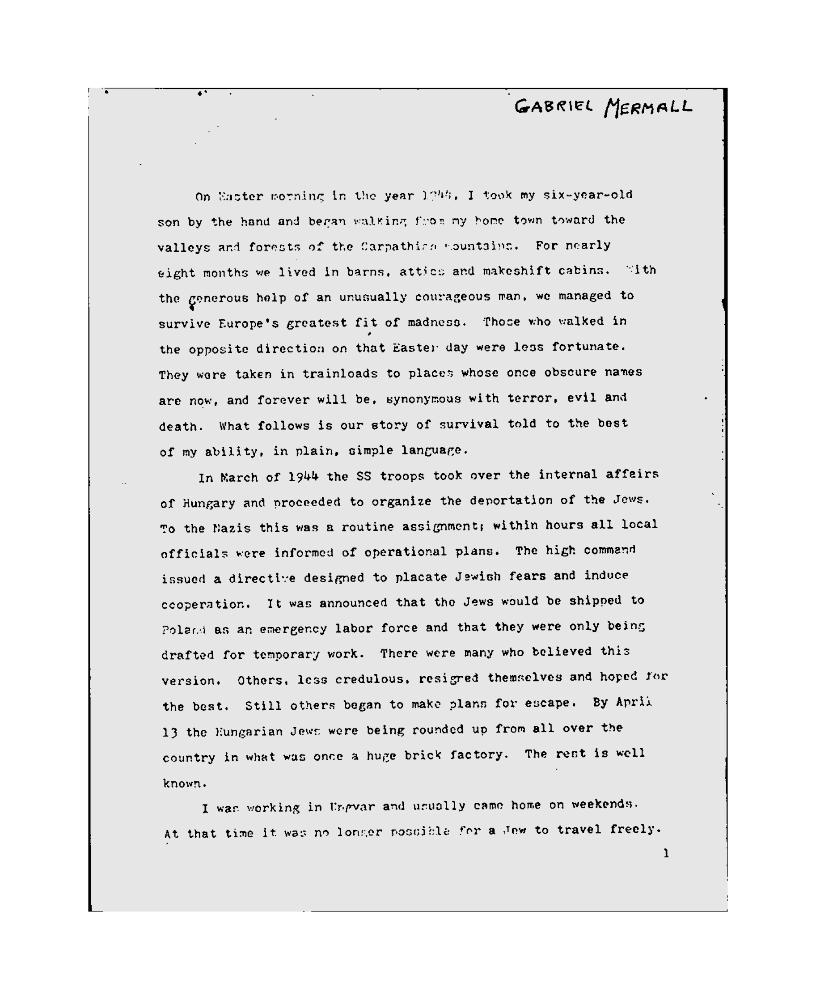

In [108]:
image_with_border = cv2.copyMakeBorder(no_border, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("temp/image_with_border.jpg", image_with_border)
display("temp/image_with_border.jpg")